<a href="https://colab.research.google.com/github/sunrita007/Exploring-Hypertension-related-Genes-and-Diseases/blob/main/Blood_Pressure.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
# Code to read csv file into colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

In [2]:
!pip install pydrive  # Install PyDrive library

In [4]:
#STEP-2: Autheticate E-Mail ID

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [5]:
#mondo_terms.csv = https://drive.google.com/file/d/1vyvXH8ZHYix74aoxrLpqmeRDSrSy-Dgg/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1vyvXH8ZHYix74aoxrLpqmeRDSrSy-Dgg'}) # replace the id with id of file you want to access
downloaded.GetContentFile('mondo_terms.csv')

#orphanet.csv = https://drive.google.com/file/d/1bVQQl-tBfjskWVZ7EdkduoDezDGL1XLb/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1bVQQl-tBfjskWVZ7EdkduoDezDGL1XLb'}) # replace the id with id of file you want to access
downloaded.GetContentFile('orphanet.csv')

#umls.csv = https://drive.google.com/file/d/17cvrG3EhKcBitnFDLOcu8Lj0paQ4nR2f/view?usp=drive_link
downloaded = drive.CreateFile({'id':'17cvrG3EhKcBitnFDLOcu8Lj0paQ4nR2f'}) # replace the id with id of file you want to access
downloaded.GetContentFile('umls.csv')

#kg_grouped_disease.csv = https://drive.google.com/file/d/1BNW53cAwg5_93-5ETWhA2LCcegAEKsuu/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1BNW53cAwg5_93-5ETWhA2LCcegAEKsuu'}) # replace the id with id of file you want to access
downloaded.GetContentFile('kg_grouped_disease.csv')

 #kg.csv = https://drive.google.com/file/d/1-64Njx-iIXBebF2jMTeumjhH-0YDdJLn/view?usp=sharing
downloaded = drive.CreateFile({'id':'1-64Njx-iIXBebF2jMTeumjhH-0YDdJLn'}) # replace the id with id of file you want to access
downloaded.GetContentFile('kg.csv')

#disease_features.csv = https://drive.google.com/file/d/1mTiQouVDTiWnFTzx7NByxOvmc8fSUp8I/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1mTiQouVDTiWnFTzx7NByxOvmc8fSUp8I'}) # replace the id with id of file you want to access
downloaded.GetContentFile('disease_features.csv')

#drug_features.csv = https://drive.google.com/file/d/1gNCE5Bgz9UaPKkjxYxG8YGYD3VNJ-37q/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1gNCE5Bgz9UaPKkjxYxG8YGYD3VNJ-37q'}) # replace the id with id of file you want to access
downloaded.GetContentFile('drug_features.csv')

#kg_giant.csv = https://drive.google.com/file/d/1Xx5LYjDzfU0-GuyGhqici3BlJLRIxCDR/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1Xx5LYjDzfU0-GuyGhqici3BlJLRIxCDR'}) # replace the id with id of file you want to access
downloaded.GetContentFile('kg_giant.csv')

#BP_genes = https://docs.google.com/spreadsheets/d/1H84Sp6FoX0AIwADydIaWATSlD3wTE712/edit?usp=sharing&ouid=117088395176722359704&rtpof=true&sd=true
downloaded = drive.CreateFile({'id':'1H84Sp6FoX0AIwADydIaWATSlD3wTE712'}) # replace the id with id of file you want to access
downloaded.GetContentFile('BP_genes.xlsx')

In [6]:
BP_genes = pd.read_excel('./BP_genes.xlsx')
BP_genes.head(2)

,Loci,Gene,RFR_Score,Training_Score,LocusGene(s),AvgScore_Per_Locus,SD_Per_Locus,Upper_SD_Threshold,direct_PPI_count,secondary_PPI_count,...,Source,Type,CP_LEADSNP,CPs,minTRAIT,min_pvalue,GPrior_Score,ToppGene_Score,Mantis_probability,GTEx_signif_sexbias
0,1,CLNS1A,0.682311,NaN,"AQP11, CLNS1A, RSF1, Y_RNA",0.472007,0.269445,0.741452,1,357,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","11:77301341, 11:77359909, 11:77378388, 11:7758...","11:77245728, 11:77245947, 11:77250912, 11:7725...",DBP,0.0,0.492653,0.250818,0.148011,1
1,2,SNTG1,0.599031,NaN,"RP11-139G7.1, SNTG1",0.362879,0.333969,0.696848,0,86,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","8:51720126, 8:51720126, 8:51720126, 8:51720126...","8:51570940, 8:51572438, 8:51572756, 8:51572757...",SBP,0.0,0.538142,0.348072,0.046035,NaN


In [7]:
BP_genes['Gene'].unique()

array(['CLNS1A', 'SNTG1', 'FOLH1', 'RSF1', 'CFDP1', 'SMARCC1', 'PTK2',
       'UBE2E3', 'XPO1', 'USP38', 'COL4A4', 'SLC4A10', 'UFL1', 'BTBD1',
       'STEAP2', 'MAK16', 'RABGAP1', 'KDM5A', 'PIAS1', 'OLA1', 'PPP2R5E',
       'LHFPL2', 'SRSF4', 'UNC5C', 'DIRC1', 'SIK2', 'TRIM13', 'NDRG4',
       'MCRS1', 'CYP11B1', 'OR5D14', 'LPXN', 'BANP', 'ODF2', 'PRICKLE1',
       'AUTS2', 'TRPC4AP', 'BCKDHB', 'STK39', 'XPR1', 'ASPN', 'CCNT2',
       'JMJD1C', 'COL8A1', 'COG5', 'TRPM7', 'ZAP70', 'CACNA2D2', 'MXI1',
       'DCDC1', 'FTO', 'NEK6', 'ATP5B', 'ARMC4', 'ARHGEF26', 'CDKN2C',
       'PKN2', 'RERG', 'TMEM108', 'LRRC69', 'TBL1XR1', 'PLA2G1B',
       'PIP5K1B', 'DYSF', 'GRM7', 'CCDC41', 'COPS4', 'UQCR10', 'ARHGEF17',
       'PRKD1', 'FBXL17', 'STXBP5', 'HIPK2', 'ARNTL', 'PITPNM2', 'CTNND1',
       'INO80', 'CHST9', 'NEDD4L', 'MLIP', 'ARRDC1', 'FBN1', 'POLN',
       'CPEB4', 'AKR1B10', 'ASXL3', 'MAST4', 'YAP1', 'WNT3A', 'SGSM3',
       'PSMD11', 'HTRA1', 'POLR3C', 'OPRM1', 'EXOC6B', 'REEP1', 'TRI

In [8]:
BP_genes.isnull().sum()

Loci                            0
Gene                            0
RFR_Score                       0
Training_Score                634
LocusGene(s)                    0
AvgScore_Per_Locus              0
SD_Per_Locus                  384
Upper_SD_Threshold            384
direct_PPI_count                0
secondary_PPI_count             0
Avg_TopGene_Diff_Per_Locus    384
Variance_Per_Locus            384
IQR_Per_Locus                   0
LocusName                      51
rsID_LEAD_SNP                  41
Source                         41
Type                           41
CP_LEADSNP                      0
CPs                             1
minTRAIT                       19
min_pvalue                     19
GPrior_Score                    2
ToppGene_Score                 67
Mantis_probability              9
GTEx_signif_sexbias           210
dtype: int64

In [9]:
dfs = []
dfs.append(('mondo', 'name', 'mondo_terms.csv'))
dfs.append(('orphanet', 'disease_name', 'orphanet.csv'))
dfs.append(('umls', 'source_name', 'umls.csv'))

In [10]:
for name, col, pth in dfs:
    if name=='mondo':
        df = pd.read_csv(pth)
        x = df.get([col]).dropna().query('{}.str.contains("hypertension")'.format(col)).drop_duplicates()
        break

Hypertension_mondo = x.get('name').values
Hypertension_mondo

array(['renal hypertension', 'malignant essential hypertension',
       'essential hypertension', 'benign essential hypertension',
       'secondary hypertension', 'benign secondary hypertension',
       'benign renovascular hypertension',
       'malignant renovascular hypertension',
       'malignant secondary hypertension',
       'primary pulmonary hypertension', 'portal hypertension',
       'pulmonary hypertension', 'early onset hypertension',
       'chemotherapy-induced hypertension', 'intracranial hypertension',
       'malignant hypertension', 'ocular hypertension',
       'renovascular hypertension (disease)',
       'brachydactyly-arterial hypertension syndrome',
       'colonic varices without portal hypertension',
       'essential hypertension, genetic',
       'autosomal dominant progressive nephropathy with hypertension',
       'osteochondrodysplasia, rhizomelic, with callosal agenesis, thrombocytopenia, hydrocephalus, and hypertension',
       'idiopathic and/or fami

In [11]:
for name, col, pth in dfs:
    df = pd.read_csv(pth)
    x = df.get([col]).dropna().query('{}.str.contains("hypertension")'.format(col)).drop_duplicates()
    print(name, x.shape[0])
    display(x)

mondo 65


,name
1093,renal hypertension
1121,malignant essential hypertension
1122,essential hypertension
1139,benign essential hypertension
1188,secondary hypertension
...,...
22161,"pulmonary hypertension, primary, 1"
22259,"hypertension, pregnancy-induced"
23649,"obsolete hypertension, diastolic, resistance to"
23726,early-onset familial noncirrhotic portal hyper...


orphanet 24


,disease_name
89,Idiopathic intracranial hypertension
173,Idiopathic pulmonary arterial hypertension
499,Pulmonary hypertension with unclear multifacto...
516,Pulmonary hypertension owing to lung disease a...
904,Pulmonary arterial hypertension associated wit...
906,Pulmonary arterial hypertension associated wit...
909,Pulmonary arterial hypertension associated wit...
910,Pulmonary arterial hypertension
911,Pulmonary arterial hypertension associated wit...
915,Pulmonary arterial hypertension associated wit...


umls 468


,source_name
173567,Goldblatt hypertension
173569,Goldblatt; hypertension
173570,hypertension; Goldblatt
173572,Goldblatt hypertension (diagnosis)
173573,Goldblatt hypertension (disorder)
...,...
1128869,Renal disease in pregnancy AND/OR puerperium w...
1128889,Albuminuria in pregnancy without hypertension
1128891,Albuminuria in pregnancy without hypertension ...
1144688,hypoadrenergic postural hypertension


In [12]:
name, col, pth = dfs[-1]
df = pd.read_csv(pth)
x = df.get([col]).dropna().query('{}.str.contains("hypertension")'.format(col)).drop_duplicates()
print(name, x.shape[0])
display(x)

umls 468


,source_name
173567,Goldblatt hypertension
173569,Goldblatt; hypertension
173570,hypertension; Goldblatt
173572,Goldblatt hypertension (diagnosis)
173573,Goldblatt hypertension (disorder)
...,...
1128869,Renal disease in pregnancy AND/OR puerperium w...
1128889,Albuminuria in pregnancy without hypertension
1128891,Albuminuria in pregnancy without hypertension ...
1144688,hypoadrenergic postural hypertension


Narrow approach - hypertension AND essential hypertension

relation with hypertension and anti hypertensive drugs (oval diagram)
anti hypertensive drugs will have indications


In [13]:
grouped_diseases = pd.read_csv('./kg_grouped_disease.csv')
grouped_diseases['node_source'].unique()

array(['MONDO'], dtype=object)

In [14]:
x = grouped_diseases.query('{}.str.contains("hypertension")'.format('node_name'))
x.get(['node_id','group_name_bert']).groupby('group_name_bert').count()

,node_id
group_name_bert,
autosomal dominant progressive nephropathy with hypertension,1
benign hypertension,2
benign renovascular hypertension,1
brachydactyly-arterial hypertension syndrome,1
chemotherapy-induced hypertension,1
chronic thromboembolic pulmonary hypertension,1
colonic varices without portal hypertension,1
drug- or toxin-induced pulmonary arterial hypertension,1
early onset hypertension,1


### Autism in RxData KG

In [15]:
#x.reset_index(inplace=True)
x

,node_id,node_type,node_name,node_source,group_name_auto,group_name_bert
17,14897,disease,"portal hypertension, noncirrhotic",MONDO,"portal hypertension, noncirrhotic","portal hypertension, noncirrhotic"
450,14136,disease,"pulmonary hypertension, primary, 4",MONDO,"pulmonary hypertension, primary","pulmonary hypertension, primary"
505,7357,disease,colonic varices without portal hypertension,MONDO,colonic varices without portal hypertension,colonic varices without portal hypertension
679,17147,disease,idiopathic pulmonary arterial hypertension,MONDO,idiopathic pulmonary arterial hypertension,idiopathic pulmonary arterial hypertension
1380,9935,disease,"pulmonary hypertension, primary, autosomal rec...",MONDO,"pulmonary hypertension, primary, autosomal rec...","pulmonary hypertension, primary, autosomal rec..."
...,...,...,...,...,...,...
20175,17158,disease,pulmonary hypertension with unclear multifacto...,MONDO,pulmonary hypertension with unclear multifacto...,pulmonary hypertension with unclear multifacto...
21513,23124,disease,familial pulmonary arterial hypertension leuco...,MONDO,familial pulmonary arterial hypertension leuco...,familial pulmonary arterial hypertension leuco...
21581,23530,disease,kallikrein hypertension,MONDO,kallikrein hypertension,kallikrein hypertension
22037,44631,disease,early-onset familial noncirrhotic portal hyper...,MONDO,early-onset familial noncirrhotic portal hyper...,early-onset familial noncirrhotic portal hyper...


In [16]:
x['node_id']

17        14897
450       14136
505        7357
679       17147
1380       9935
          ...  
20175     17158
21513     23124
21581     23530
22037     44631
22162    100078
Name: node_id, Length: 62, dtype: int64

In [17]:
kg = pd.read_csv('./kg.csv', low_memory=False)
kg['y_source'].unique()

array(['NCBI', 'MONDO', 'MONDO_grouped', 'DrugBank', 'HPO', 'GO', 'CTD',
       'REACTOME', 'UBERON'], dtype=object)

In [18]:
# Step 3: Extract 'gene1' column values from dataset 1
gene1_list = BP_genes['Gene'].tolist()

kg = kg[kg['x_name'].isin(gene1_list)]

# Step 5: Print the entire dataset2 with the queried genes from gene1
kg['x_source'].unique()

array(['NCBI'], dtype=object)

In [19]:
node_id = x['node_id'].tolist()

In [20]:
kg_common = kg[kg['x_id'].isin(node_id)]

# Step 5: Print the entire dataset2 with the queried genes from gene1
kg_common.head(10)

,relation,display_relation,x_index,x_id,x_type,x_name,x_source,y_index,y_id,y_type,y_name,y_source


#Disease in KG

In [21]:
kg_giant = pd.read_csv('./kg_giant.csv')
kg_giant = kg_giant[kg_giant['x_name'].isin(gene1_list)]

<ipython-input-21-29addfd98f2a>:1: DtypeWarning: Columns (2,6) have mixed types. Specify dtype option on import or set low_memory=False.
  kg_giant = pd.read_csv('./kg_giant.csv')


In [22]:
disease_features = pd.read_csv('./disease_features.csv')
disease_features.head(20)

,node_index,mondo_id,mondo_name,group_id_bert,group_name_bert,mondo_definition,umls_description,orphanet_definition,orphanet_prevalence,orphanet_epidemiology,orphanet_clinical_description,orphanet_management_and_treatment,mayo_symptoms,mayo_causes,mayo_risk_factors,mayo_complications,mayo_prevention,mayo_see_doc
0,27165,8019,mullerian aplasia and hyperandrogenism,NaN,NaN,"Deficiency of the glycoprotein WNT4, associate...","Deficiency of the glycoprotein wnt4, associate...","A rare syndrome with 46,XX disorder of sex dev...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,27165,8019,mullerian aplasia and hyperandrogenism,NaN,NaN,"Deficiency of the glycoprotein WNT4, associate...","Deficiency of the glycoprotein wnt4, associate...","A rare syndrome with 46,XX disorder of sex dev...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,27166,11043,"myelodysplasia, immunodeficiency, facial dysmo...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,27168,8878,"bone dysplasia, lethal Holmgren type",NaN,NaN,Bone dysplasia lethal Holmgren type (BDLH) is ...,A lethal bone dysplasia with characteristics o...,Bone dysplasia lethal Holmgren type (BDLH) is ...,<1/1000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,27169,8905,predisposition to invasive fungal disease due ...,NaN,NaN,NaN,NaN,"A rare, genetic primary immunodeficiency chara...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,27171,7162,asymmetric short stature syndrome,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,27172,9699,action myoclonus-renal failure syndrome,NaN,NaN,Action myoclonus-renal failure syndrome (AMRF)...,Syndrome with characteristics of episodes of m...,A rare epilepsy syndrome characterized by prog...,<1/1000000,NaN,NaN,NaN,People with myoclonus often describe their sig...,Myoclonus may be caused by a variety of underl...,NaN,NaN,NaN,"When to see a doctor, If your myoclonus sympto..."
7,27175,14897,"portal hypertension, noncirrhotic",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,27176,12035,craniosynostosis-intracranial calcifications s...,NaN,NaN,Craniosynostosis-intracranial calcification is...,A form of syndromic craniosynostosis with char...,Craniosynostosis-intracranial calcifications s...,<1/1000000,NaN,NaN,NaN,The signs of craniosynostosis are usually noti...,Often the cause of craniosynostosis is not kno...,"If untreated, craniosynostosis may cause, for ...",NaN,NaN,"When to see a doctor, Your doctor will routine..."
9,27176,12035,craniosynostosis-intracranial calcifications s...,NaN,NaN,Craniosynostosis-intracranial calcification is...,A form of syndromic craniosynostosis with char...,Craniosynostosis-intracranial calcifications s...,<1/1000000,NaN,NaN,NaN,The signs of craniosynostosis are usually noti...,Often the cause of craniosynostosis is not kno...,"If untreated, craniosynostosis may cause, for ...",NaN,NaN,"When to see a doctor, Your doctor will routine..."


In [23]:
kg_giant['x_source'].unique()

array(['NCBI'], dtype=object)

In [24]:
kg_giant['y_source'].unique()

array(['NCBI', 'HPO', 'MONDO', 'GO', 'REACTOME', 'UBERON', 'DrugBank',
       'CTD'], dtype=object)

In [25]:
# Filtering rows where x_name is 'NCBI' and y_name is 'MONDO'
result = kg_giant[(kg_giant['x_source'] == 'NCBI') & (kg_giant['y_source'] == 'MONDO')]
result

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3265974,disease_protein,associated with,132,gene/protein,ADK,NCBI,5090,disease,schizophrenia (disease),MONDO
3265976,disease_protein,associated with,134,gene/protein,ADORA1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265983,disease_protein,associated with,182,gene/protein,JAG1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265990,disease_protein,associated with,288,gene/protein,ANK3,NCBI,5090,disease,schizophrenia (disease),MONDO
3265995,disease_protein,associated with,348,gene/protein,APOE,NCBI,5090,disease,schizophrenia (disease),MONDO
...,...,...,...,...,...,...,...,...,...,...
3358490,disease_protein,associated with,4846,gene/protein,NOS3,NCBI,4846,disease,placental abruption (disease),MONDO
3358492,disease_protein,associated with,3106,gene/protein,HLA-B,NCBI,6547,disease,exanthem (disease),MONDO
3358520,disease_protein,associated with,2260,gene/protein,FGFR1,NCBI,313,disease,hypophosphatemia (disease),MONDO
3358524,disease_protein,associated with,4988,gene/protein,OPRM1,NCBI,2203,disease,constipation disorder,MONDO


In [26]:
# Filtering rows where y_name contains "hypertension"
result = result[result['y_name'].str.contains("hypertension")]
print(result['relation'].unique())
print(result['display_relation'].unique())

['disease_protein']
['associated with']


In [27]:
result.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3305791,disease_protein,associated with,358,gene/protein,AQP1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305793,disease_protein,associated with,857,gene/protein,CAV1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305795,disease_protein,associated with,2658,gene/protein,GDF2,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305797,disease_protein,associated with,3777,gene/protein,KCNK3,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305806,disease_protein,associated with,440275,gene/protein,EIF2AK4,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305809,disease_protein,associated with,857,gene/protein,CAV1,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
3305811,disease_protein,associated with,3777,gene/protein,KCNK3,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
3305814,disease_protein,associated with,440275,gene/protein,EIF2AK4,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
3305821,disease_protein,associated with,658,gene/protein,BMPR1B,NCBI,17147,disease,idiopathic pulmonary arterial hypertension,MONDO
3305822,disease_protein,associated with,658,gene/protein,BMPR1B,NCBI,24533,disease,"pulmonary hypertension, primary, 1",MONDO


In [28]:
result['y_name'].unique()

array(['heritable pulmonary arterial hypertension',
       'pulmonary arterial hypertension',
       'idiopathic pulmonary arterial hypertension',
       'pulmonary hypertension, primary, 1', 'essential hypertension',
       'essential hypertension, genetic', 'malignant hypertension',
       'renal hypertension', 'portal hypertension',
       'primary pulmonary hypertension',
       'idiopathic and/or familial pulmonary arterial hypertension',
       'pulmonary hypertension', 'pulmonary hypertension, primary, 3',
       'pulmonary arterial hypertension associated with connective tissue disease',
       'pulmonary hypertension, primary, 4',
       'renovascular hypertension (disease)',
       'brachydactyly-arterial hypertension syndrome',
       'hyperuricemia-pulmonary hypertension-renal failure-alkalosis syndrome',
       'intracranial hypertension'], dtype=object)

In [29]:
result.query('y_name == "essential hypertension, genetic"')

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3311162,disease_protein,associated with,183,gene/protein,AGT,NCBI,7781,disease,"essential hypertension, genetic",MONDO
3311183,disease_protein,associated with,4846,gene/protein,NOS3,NCBI,7781,disease,"essential hypertension, genetic",MONDO


#Drugs associated with KG

In [30]:
drug_features = pd.read_csv('./drug_features.csv')
drug_features.head(2)

,node_index,description,half_life,indication,mechanism_of_action,protein_binding,pharmacodynamics,state,atc_1,atc_2,atc_3,atc_4,category,group,pathway,molecular_weight,tpsa,clogp
0,14012,Copper is a transition metal and a trace eleme...,NaN,For use in the supplementation of total parent...,Copper is absorbed from the gut via high affin...,Copper is nearly entirely bound by ceruloplasm...,Copper is incorporated into many enzymes throu...,Copper is a solid.,NaN,NaN,NaN,NaN,Copper is part of Copper-containing Intrauteri...,Copper is approved and investigational.,NaN,NaN,NaN,NaN
1,14013,Oxygen is an element displayed by the symbol O...,The half-life is approximately 122.24 seconds,Oxygen therapy in clinical settings is used ac...,Oxygen therapy increases the arterial pressure...,Oxygen binds to oxygen-carrying protein in red...,Oxygen therapy improves effective cellular oxy...,Oxygen is a gas.,Oxygen is anatomically related to various.,Oxygen is in the therapeutic group of all othe...,Oxygen is pharmacologically related to all oth...,The chemical and functional group of is medic...,Oxygen is part of Chalcogens ; Elements ; Gase...,Oxygen is approved and vet_approved.,NaN,The molecular weight is 32.0.,Oxygen has a topological polar surface area of...,NaN


In [31]:
kg_giant.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
29,protein_protein,ppi,2147,gene/protein,F2,NCBI,6696,gene/protein,SPP1,NCBI
68,protein_protein,ppi,10291,gene/protein,SF3A1,NCBI,29093,gene/protein,MRPL22,NCBI
122,protein_protein,ppi,358,gene/protein,AQP1,NCBI,157556,gene/protein,BAALC-AS2,NCBI
150,protein_protein,ppi,4088,gene/protein,SMAD3,NCBI,5515,gene/protein,PPP2CA,NCBI
169,protein_protein,ppi,7514,gene/protein,XPO1,NCBI,10413,gene/protein,YAP1,NCBI
172,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,64755,gene/protein,RUSF1,NCBI
178,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,8575,gene/protein,PRKRA,NCBI
179,protein_protein,ppi,1295,gene/protein,COL8A1,NCBI,4856,gene/protein,CCN3,NCBI
187,protein_protein,ppi,5728,gene/protein,PTEN,NCBI,7804,gene/protein,LRP8,NCBI
225,protein_protein,ppi,4878,gene/protein,NPPA,NCBI,23203,gene/protein,PMPCA,NCBI


In [32]:
node_list = drug_features['node_index'].tolist()

result_drug = kg_giant[kg_giant['y_id'].isin(node_list)]
result_drug.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3268468,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268471,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268516,disease_protein,associated with,595,gene/protein,CCND1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268519,disease_protein,associated with,595,gene/protein,CCND1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268520,disease_protein,associated with,596,gene/protein,BCL2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268523,disease_protein,associated with,596,gene/protein,BCL2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268544,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268547,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268580,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268583,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO


In [33]:
rsp = drug_features.query('node_index == 21063')
for c in rsp.columns:
    print(c, rsp.get([c]).drop_duplicates().dropna().values.reshape(-1), '\n')

node_index [21063] 

description ["Human Varicella-Zoster Immune Globulin is a solvent/detergent-treated sterile liquid preparation of purified human immune globulin G (IgG) containing antibodies to varicella zoster virus (anti-VZV). It is prepared from pools of healthy human donors' plasma via anion-exchange column chromatography and was approved in 2012 under the name VariZIG to reduce the disease severity in high-risk patients who lack evidence of immunity to varicella and for whom varicella vaccine is contraindicated. The therapeutic efficacy is proven if administered within 4 days of exposure to varicella zoster virus."] 

half_life ['Human Varicella-Zoster Immunoglobulin has a half-life of about 18-24 days following intravenous administration and 24-30 days following intramuscular administration. '] 

indication ['Indicated for preventing and reducing the severity of chicken pox (varicella zoster virus) infections in high risk individuals within 4 days of exposure to varicella zo

#Concatenate result and result_drug

In [34]:
result.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3305791,disease_protein,associated with,358,gene/protein,AQP1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305793,disease_protein,associated with,857,gene/protein,CAV1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305795,disease_protein,associated with,2658,gene/protein,GDF2,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305797,disease_protein,associated with,3777,gene/protein,KCNK3,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305806,disease_protein,associated with,440275,gene/protein,EIF2AK4,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3305809,disease_protein,associated with,857,gene/protein,CAV1,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
3305811,disease_protein,associated with,3777,gene/protein,KCNK3,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
3305814,disease_protein,associated with,440275,gene/protein,EIF2AK4,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
3305821,disease_protein,associated with,658,gene/protein,BMPR1B,NCBI,17147,disease,idiopathic pulmonary arterial hypertension,MONDO
3305822,disease_protein,associated with,658,gene/protein,BMPR1B,NCBI,24533,disease,"pulmonary hypertension, primary, 1",MONDO


In [35]:
result_drug.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3268468,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268471,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268516,disease_protein,associated with,595,gene/protein,CCND1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268519,disease_protein,associated with,595,gene/protein,CCND1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268520,disease_protein,associated with,596,gene/protein,BCL2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268523,disease_protein,associated with,596,gene/protein,BCL2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268544,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268547,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268580,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268583,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO


In [36]:
# Concatenate the dataframes vertically
result = pd.concat([result, result_drug], ignore_index=True)

# Display the combined dataframe
result.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
0,disease_protein,associated with,358,gene/protein,AQP1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
1,disease_protein,associated with,857,gene/protein,CAV1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
2,disease_protein,associated with,2658,gene/protein,GDF2,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
3,disease_protein,associated with,3777,gene/protein,KCNK3,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
4,disease_protein,associated with,440275,gene/protein,EIF2AK4,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO
5,disease_protein,associated with,857,gene/protein,CAV1,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
6,disease_protein,associated with,3777,gene/protein,KCNK3,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
7,disease_protein,associated with,440275,gene/protein,EIF2AK4,NCBI,15924,disease,pulmonary arterial hypertension,MONDO
8,disease_protein,associated with,658,gene/protein,BMPR1B,NCBI,17147,disease,idiopathic pulmonary arterial hypertension,MONDO
9,disease_protein,associated with,658,gene/protein,BMPR1B,NCBI,24533,disease,"pulmonary hypertension, primary, 1",MONDO


In [37]:
# Count the occurrences of each unique value in the 'y_name' column
occurrences = result['y_name'].value_counts()
# Convert the Series to a DataFrame
occurrences_df = occurrences.reset_index()
occurrences_df.columns = ['y_name', 'occurrences']

# Display the occurrences DataFrame
occurrences_df= occurrences_df[occurrences_df['y_name'].str.contains("hypertension")]
occurrences_df.to_csv('occurence.csv')

In [38]:
occurrences_df[occurrences_df['y_name'].str.contains("hypertension")]

,y_name,occurrences
73,heritable pulmonary arterial hypertension,12
94,pulmonary arterial hypertension,8
95,idiopathic pulmonary arterial hypertension,8
137,renal hypertension,5
172,idiopathic and/or familial pulmonary arterial ...,4
207,"pulmonary hypertension, primary, 1",4
284,pulmonary hypertension,3
294,primary pulmonary hypertension,3
310,"pulmonary hypertension, primary, 3",2
344,"pulmonary hypertension, primary, 4",2


#Machine learning

In [50]:
result.to_csv('result.csv')

In [43]:
result.columns

Index(['relation', 'display_relation', 'x_id', 'x_type', 'x_name', 'x_source',
       'y_id', 'y_type', 'y_name', 'y_source'],
      dtype='object')

In [44]:
data = result

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

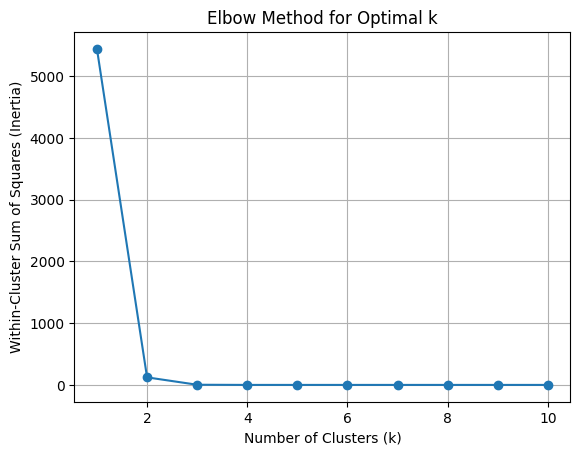

In [54]:

# Assuming you have the dataframe named 'data' as described in your question

# Separate features and labels
X = data.drop(columns=['y_name'])  # Drop the 'y_name' column as it's the target variable for clustering
y = data['y_name']

# Separate numerical and categorical features
#numerical_features = ['x_id', 'y_id']
categorical_features = ['relation', 'display_relation', 'x_type', 'x_name', 'x_source', 'y_type', 'y_source']

# Create pipelines for numerical and categorical features
#numerical_pipeline = Pipeline(steps=[('scaler', StandardScaler())])
categorical_pipeline = Pipeline(steps=[('onehot', OneHotEncoder())])

# Create a column transformer to handle different types of features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_pipeline, categorical_features)
    ])

# Apply preprocessing to the features
X_preprocessed = preprocessor.fit_transform(X)

# Perform TruncatedSVD for feature selection
svd = TruncatedSVD(n_components=2)  # Choose the number of components (2 for visualization purposes)
X_svd = svd.fit_transform(X_preprocessed)

# Initialize a list to store the inertia values for different k
inertia_values = []

# Try different values of k (e.g., from 1 to 10)
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_svd)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow curve
plt.plot(range(1, 11), inertia_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (Inertia)')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

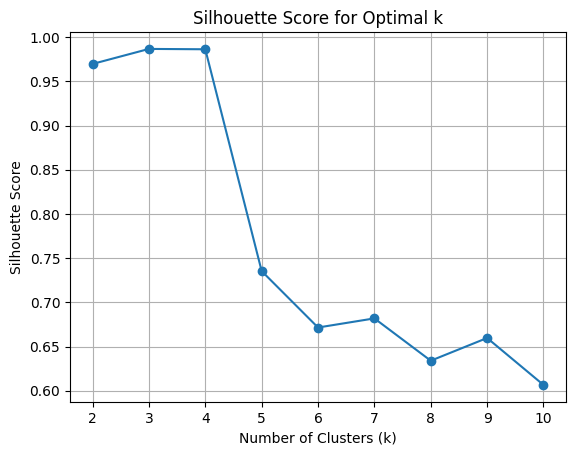

In [57]:
# Assuming you have the dataframe named 'data' as described in your question

# Separate features and labels
X = data.drop(columns=['y_name'])  # Drop the 'y_name' column as it's the target variable for clustering
y = data['y_name']

# Separate numerical and categorical features
#numerical_features = ['x_id', 'y_id']
categorical_features = ['relation', 'display_relation', 'x_type', 'x_name', 'x_source', 'y_type', 'y_source']

# Create pipelines for numerical and categorical features
#numerical_pipeline = Pipeline(steps=[('scaler', StandardScaler())])
categorical_pipeline = Pipeline(steps=[('onehot', OneHotEncoder())])

# Create a column transformer to handle different types of features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_pipeline, categorical_features)
    ])

# Apply preprocessing to the features
X_preprocessed = preprocessor.fit_transform(X)

# Perform TruncatedSVD for feature selection
svd = TruncatedSVD(n_components=2)  # Choose the number of components (2 for visualization purposes)
X_svd = svd.fit_transform(X_preprocessed)

# Initialize a list to store the silhouette scores for different k
silhouette_scores = []

# Try different values of k (e.g., from 2 to 10)
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_svd)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X_svd, labels))

# Plot the Silhouette Score
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.grid(True)
plt.show()


In [60]:
result[result['cluster']==1]

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source,cluster
1,disease_protein,associated with,857,gene/protein,CAV1,NCBI,17148,disease,heritable pulmonary arterial hypertension,MONDO,1
5,disease_protein,associated with,857,gene/protein,CAV1,NCBI,15924,disease,pulmonary arterial hypertension,MONDO,1
11,disease_protein,associated with,857,gene/protein,CAV1,NCBI,17147,disease,idiopathic pulmonary arterial hypertension,MONDO,1
12,disease_protein,associated with,857,gene/protein,CAV1,NCBI,24533,disease,"pulmonary hypertension, primary, 1",MONDO,1
25,disease_protein,associated with,7422,gene/protein,VEGFA,NCBI,5080,disease,portal hypertension,MONDO,1
...,...,...,...,...,...,...,...,...,...,...,...
2444,disease_protein,associated with,54790,gene/protein,TET2,NCBI,19157,disease,acquired idiopathic sideroblastic anemia,MONDO,1
2451,disease_protein,associated with,54790,gene/protein,TET2,NCBI,19454,disease,myelodysplastic syndrome with excess blasts,MONDO,1
2452,disease_protein,associated with,54790,gene/protein,TET2,NCBI,15040,disease,myelodysplastic syndrome with excess blasts-1,MONDO,1
2453,disease_protein,associated with,54790,gene/protein,TET2,NCBI,15041,disease,myelodysplastic syndrome with excess blasts-2,MONDO,1


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


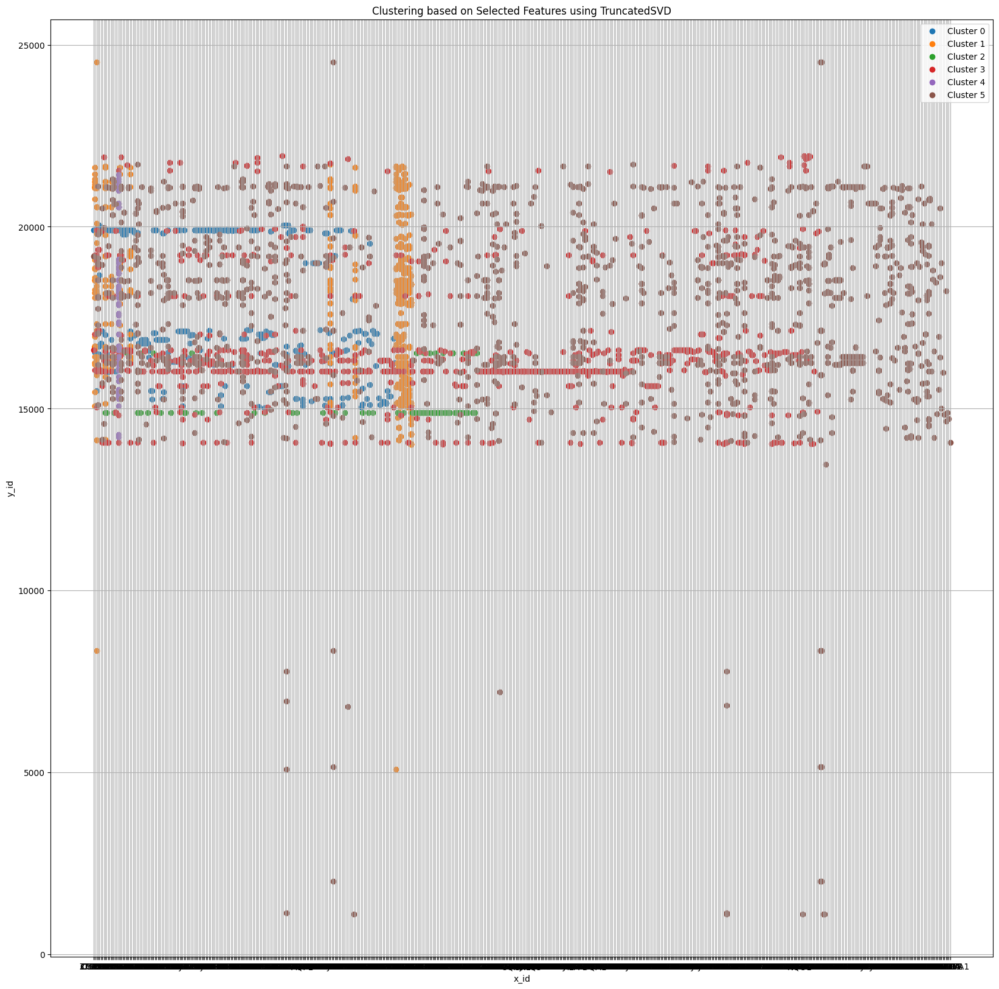

In [58]:

# Assuming you have the dataframe named 'data' as described in your question

# Separate features and labels
X = data.drop(columns=['y_name'])  # Drop the 'y_name' column as it's the target variable for clustering
y = data['y_name']

# Separate numerical and categorical features
categorical_features = ['relation', 'display_relation', 'x_type', 'x_name', 'x_source']

# Create pipelines for numerical and categorical features
categorical_pipeline = Pipeline(steps=[('onehot', OneHotEncoder())])

# Create a column transformer to handle different types of features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_pipeline, categorical_features)
    ])

# Apply preprocessing to the features
X_preprocessed = preprocessor.fit_transform(X)

# Perform TruncatedSVD for feature selection
svd = TruncatedSVD(n_components=2)  # Choose the number of components (2 for visualization purposes)
X_svd = svd.fit_transform(X_preprocessed)

# Apply K-means clustering on the selected features
num_clusters = 6 # You can set the desired number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_svd)

# Add the cluster labels back to the dataframe
data['cluster'] = clusters

# Visualize the clusters using a scatter plot
plt.figure(figsize=(20, 20))
for cluster_label in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster_label]
    plt.scatter(cluster_data['x_name'], cluster_data['y_id'], label=f'Cluster {cluster_label}')
plt.xlabel('x_id')
plt.ylabel('y_id')
plt.title('Clustering based on Selected Features using TruncatedSVD')
plt.legend()
plt.grid(True)
plt.show()


#Viewing Knowledge Graph

In [61]:
# Create an empty graph
G = nx.Graph()

In [66]:
def create_and_visualize_graph(relation_data, node_size=500, node_color='skyblue', font_size=12, font_weight='bold'):
    # Create an empty directed graph
    graph = nx.DiGraph()

    for item in relation_data:
        relation_type = item[0]
        relation_name = item[1]
        source_id = item[2]
        target_type = item[3]
        target_name = item[4]
        target_source = item[5]
        target_id = item[6]
        disease_name = item[8]
        mondo_id = item[9]

        # Add nodes and edges to the graph
        # Modify label and type as needed for the source node
        graph.add_node(mondo_id, label=disease_name, type='disease')
        graph.add_edge(target_name, mondo_id, relation=relation_type)
        graph.add_node('NCBI', label='NCBI', type='identifier')
        graph.add_node(target_name, label=target_name, type=target_type)
        graph.add_edge('NCBI', target_name, relation='source of')

    # Draw the graph
    pos = nx.spring_layout(graph, seed=42)  # Using a fixed random seed for consistent layout
    node_labels = nx.get_node_attributes(graph, 'label')
    edge_labels = nx.get_edge_attributes(graph, 'relation')

    plt.figure(figsize=(20, 20))  # Adjust the figure size as needed

    # Draw nodes
    nx.draw_networkx_nodes(graph, pos, node_size=node_size, node_color=node_color, alpha=0.8)
    # Draw node label
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight=font_weight)
    # Draw edges
    nx.draw_networkx_edges(graph, pos, width=1.0, alpha=0.5, edge_color='grey')
    # Draw edge labels
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, font_size=font_size - 2)
    # Set plot title and axis labels if needed
    plt.title("Graph Visualization", fontsize=16)

    # Show the plot
    plt.tight_layout()
    plt.show()


In [67]:
# Extract information from the provided table
cluster0 = list(result.query('cluster == 0').to_records(index=False))
cluster1 = list(result.query('cluster == 1').to_records(index=False))
cluster2 = list(result.query('cluster == 2').to_records(index=False))
cluster3 = list(result.query('cluster == 3').to_records(index=False))
cluster4 = list(result.query('cluster == 4').to_records(index=False))
cluster5 = list(result.query('cluster == 5').to_records(index=False))

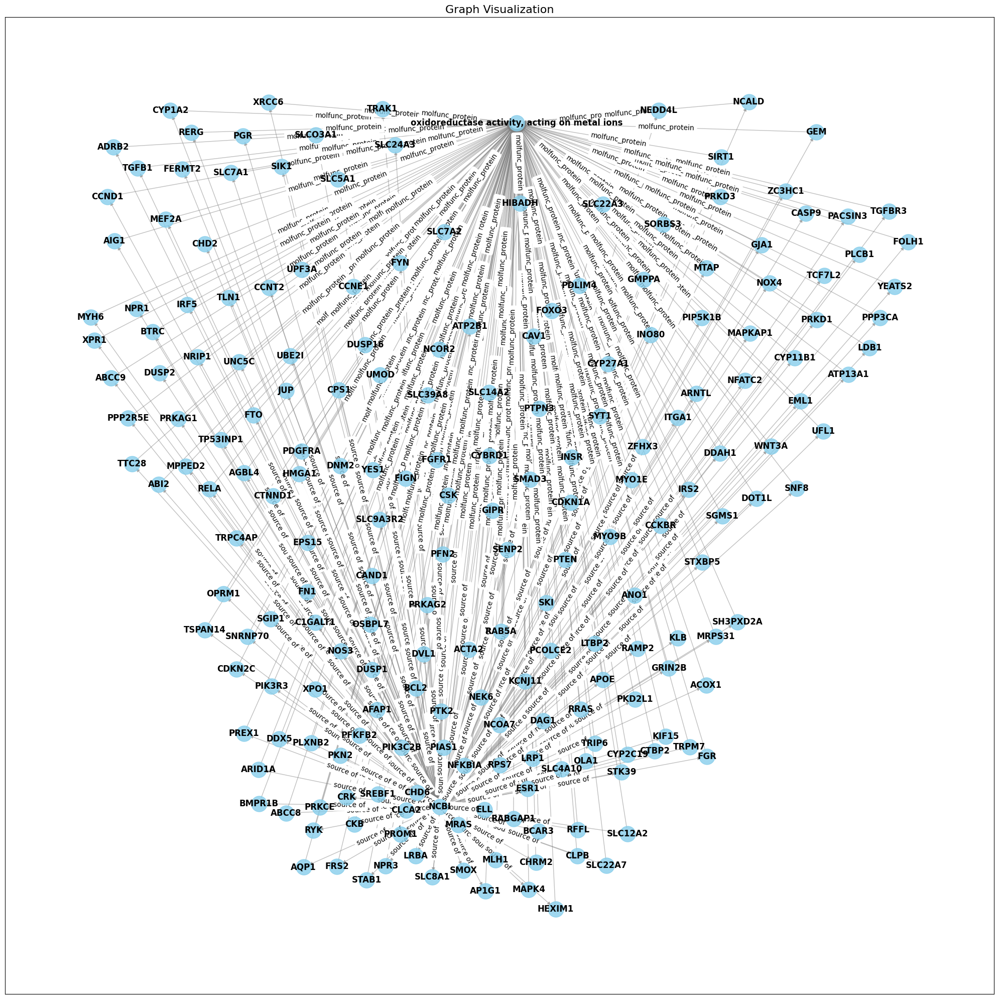

In [68]:
create_and_visualize_graph(cluster0)

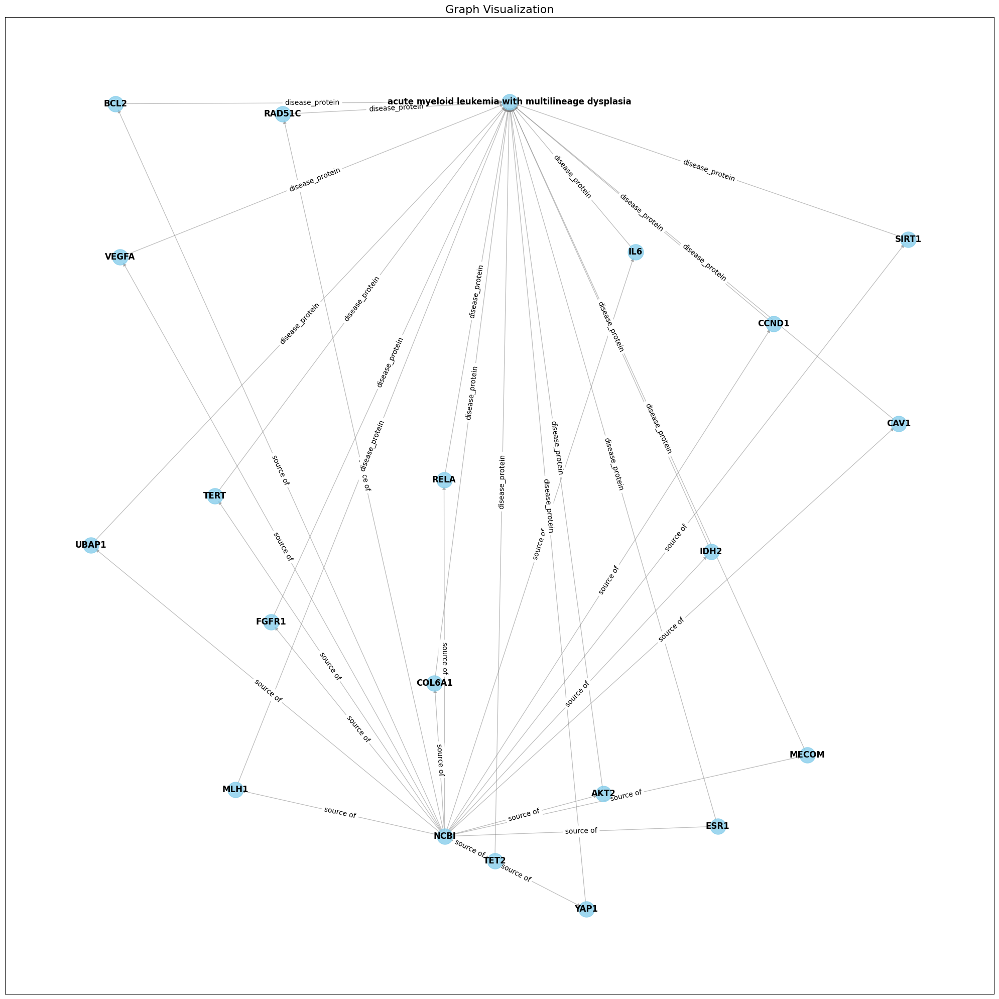

In [69]:
create_and_visualize_graph(cluster1)

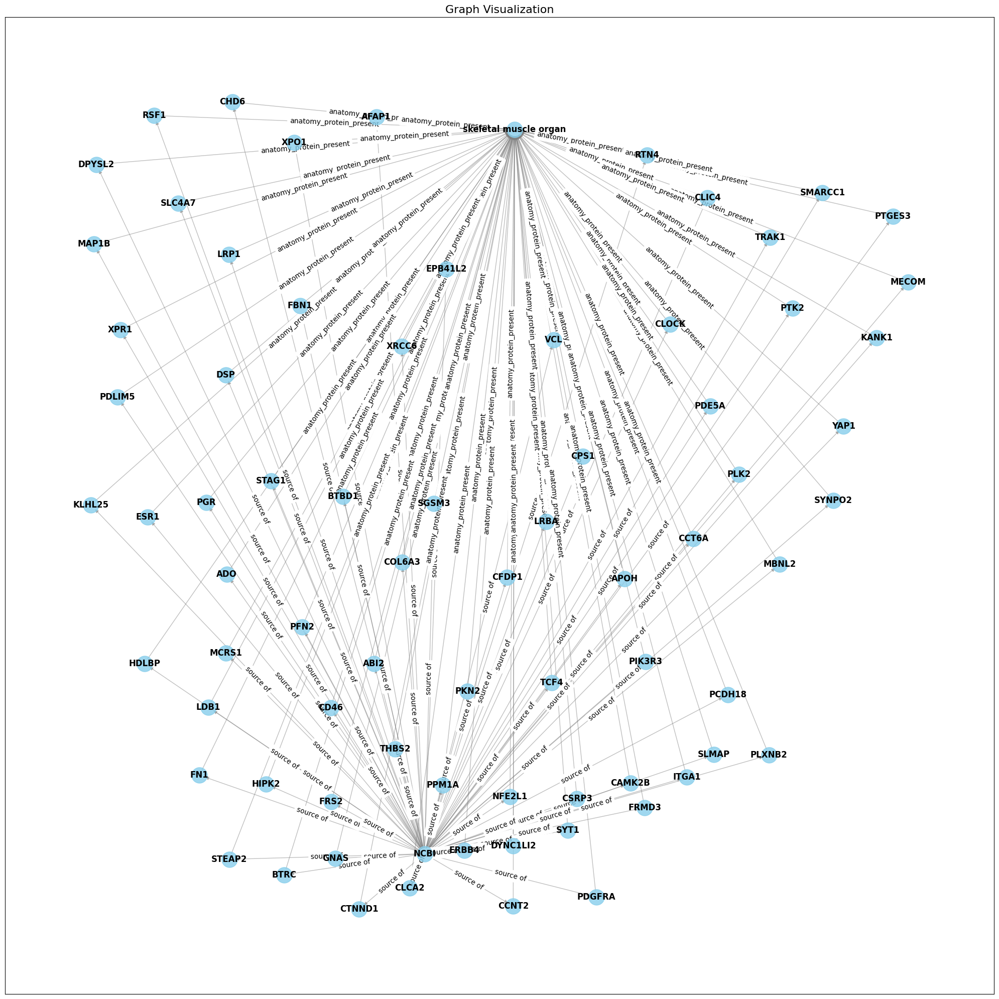

In [70]:
create_and_visualize_graph(cluster2)

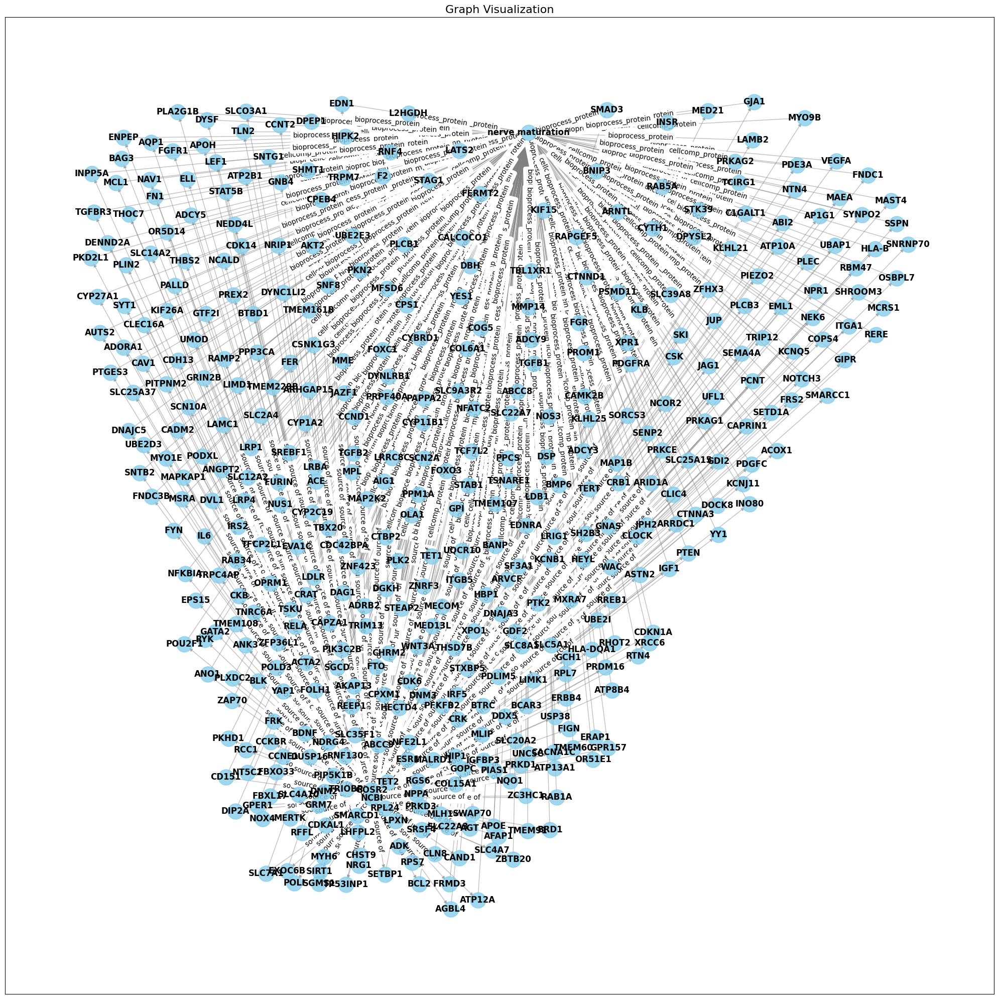

In [71]:
create_and_visualize_graph(cluster3)

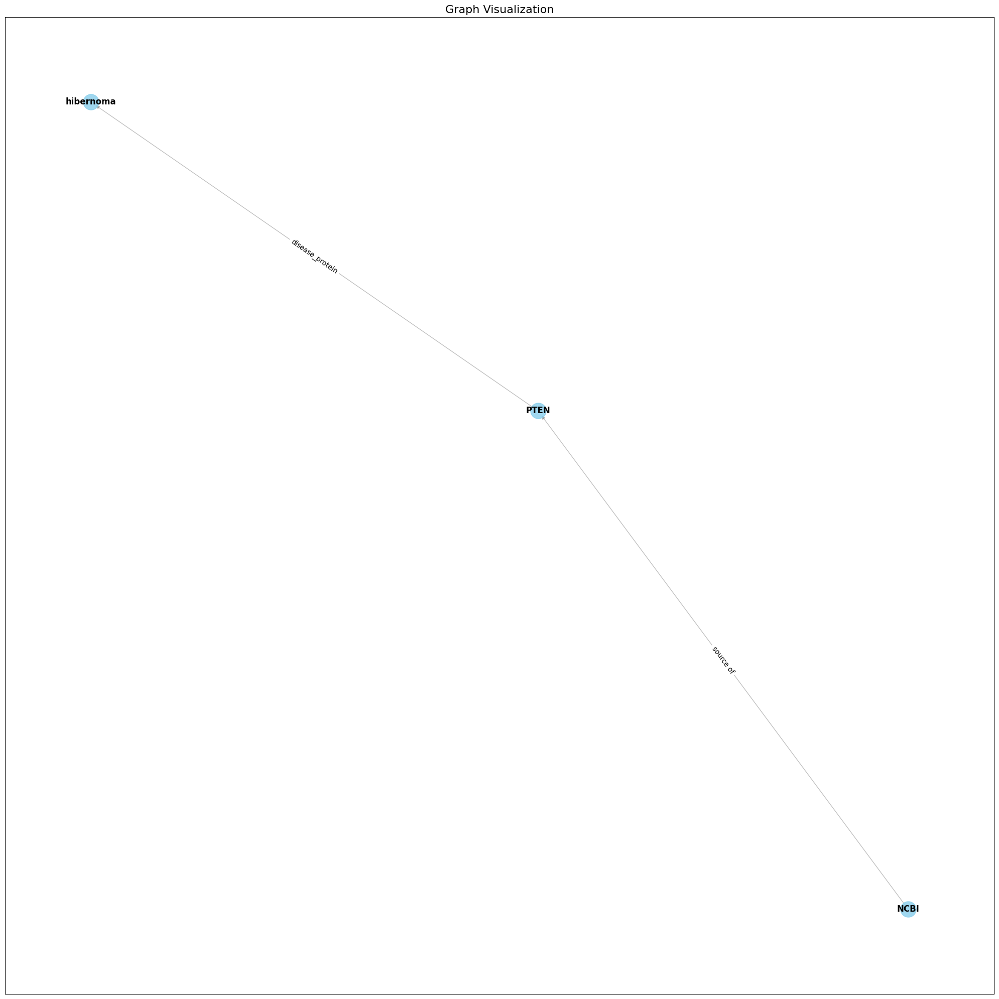

In [72]:
create_and_visualize_graph(cluster4)

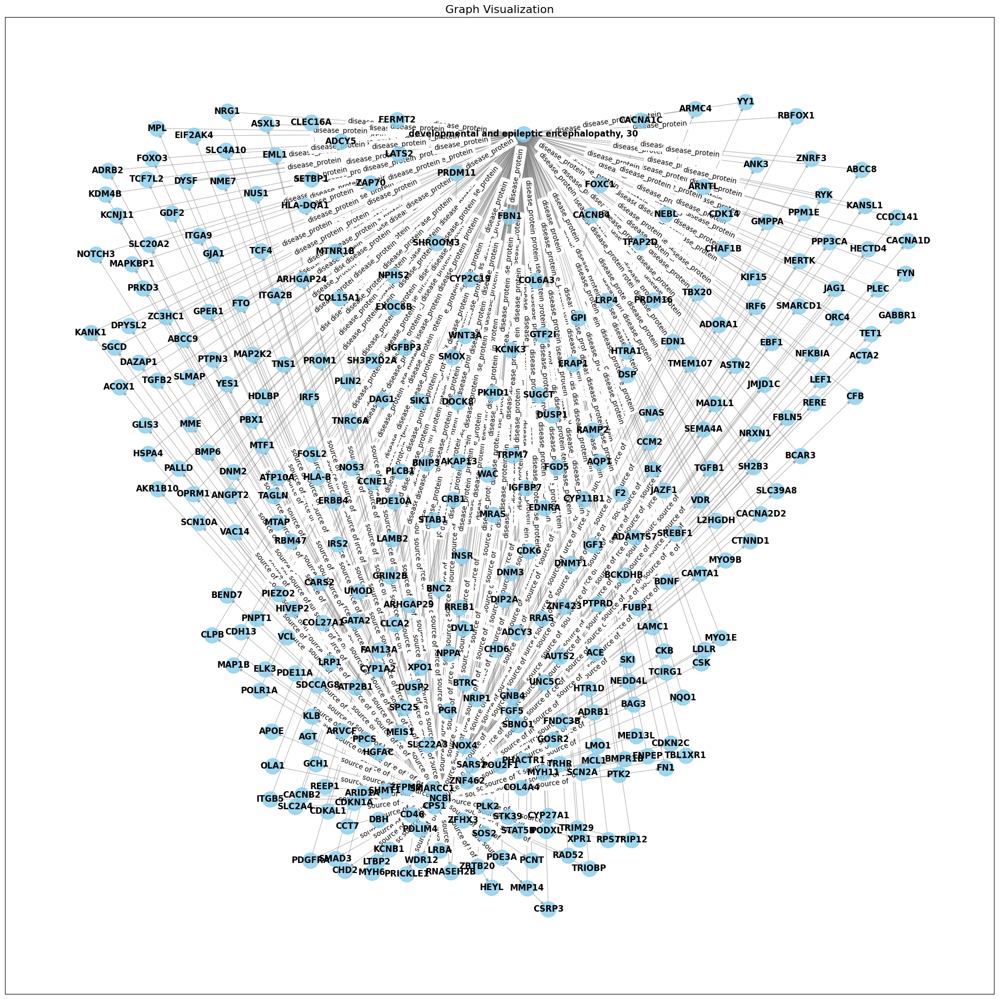

In [73]:
create_and_visualize_graph(cluster5)